In [1]:
import gensim.downloader
import pandas as pd
import numpy as np
import torch
import random
from nltk.tokenize import word_tokenize
from sklearn.metrics import accuracy_score
import datasets
import matplotlib.pyplot as plt
# enabling inline plots in Jupyter
%matplotlib inline
datasets.logging.set_verbosity_error()
import nltk
nltk.download('punkt')

torch.manual_seed(42)
random.seed(42)
np.random.seed(42)

[nltk_data] Downloading package punkt to
[nltk_data]     /Users/emmastoklundlee/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [2]:
pip install transformers

Note: you may need to restart the kernel to use updated packages.


In [3]:
# Preamble 
import sys 
sys.path.append('..')

In [4]:
from datasets import load_dataset
import pandas as pd

dataset = load_dataset("copenlu/answerable_tydiqa")

train_set = dataset["train"]
validation_set = dataset["validation"]

df_train = train_set.to_pandas()
df_val = validation_set.to_pandas()

df_train.head()

  0%|          | 0/2 [00:00<?, ?it/s]

,question_text,document_title,language,annotations,document_plaintext,document_url
0,Milloin Charles Fort syntyi?,Charles Fort,finnish,"{'answer_start': [18], 'answer_text': ['6. elo...",Charles Hoy Fort (6. elokuuta (joidenkin lähte...,https://fi.wikipedia.org/wiki/Charles%20Fort
1,“ダン” ダニエル・ジャドソン・キャラハンの出身はどこ,ダニエル・J・キャラハン,japanese,"{'answer_start': [35], 'answer_text': ['カリフォルニ...",“ダン”こと、ダニエル・ジャドソン・キャラハンは1890年7月26日、カリフォルニア州サンフ...,https://ja.wikipedia.org/wiki/%E3%83%80%E3%83%...
2,వేప చెట్టు యొక్క శాస్త్రీయ నామం ఏమిటి?,వేప,telugu,"{'answer_start': [12], 'answer_text': ['Azadir...","వేప (లాటిన్ Azadirachta indica, syn. Melia aza...",https://te.wikipedia.org/wiki/%E0%B0%B5%E0%B1%...
3,চেঙ্গিস খান কোন বংশের রাজা ছিলেন ?,চেঙ্গিজ খান,bengali,"{'answer_start': [414], 'answer_text': ['বোরজি...",চেঙ্গিজ খান (মঙ্গোলীয়: Чингис Хаан আ-ধ্ব-ব: ...,https://bn.wikipedia.org/wiki/%E0%A6%9A%E0%A7%...
4,రెయ్యలగడ్ద గ్రామ విస్తీర్ణత ఎంత?,రెయ్యలగడ్ద,telugu,"{'answer_start': [259], 'answer_text': ['27 హె...","రెయ్యలగడ్ద, విశాఖపట్నం జిల్లా, గంగరాజు మాడుగుల...",https://te.wikipedia.org/wiki/%E0%B0%B0%E0%B1%...


In [5]:
# Creating a binary column where if the question is answered it is equal to 1, and if not answerable it is 0
def check_annotations(annotation):
    return annotation == {'answer_start': [-1], 'answer_text': ['']}

df_train['correct_answer'] = df_train['annotations'].apply(check_annotations)
df_train['correct_answer'] = (~df_train['correct_answer']).astype(int)

df_val['correct_answer'] = df_val['annotations'].apply(check_annotations)
df_val['correct_answer'] = (~df_val['correct_answer']).astype(int)

In [6]:
# Get train and validation data for each language
df_train_bengali = df_train[df_train['language'] == 'bengali']
df_train_arabic = df_train[df_train['language'] == 'arabic']
df_train_indonesian = df_train[df_train['language'] == 'indonesian']

df_val_bengali = df_val[df_val['language'] == 'bengali']
df_val_arabic = df_val[df_val['language'] == 'arabic']
df_val_indonesian = df_val[df_val['language'] == 'indonesian']

# For testing
df_val_english = df_val[df_val['language'] == 'english']
df_train_english = df_train[df_train['language'] == 'english']

In [7]:
df_train_bengali_document = df_train[df_train['language'] == 'bengali']["document_plaintext"]
df_train_arab_document = df_train[df_train['language'] == 'arabic']["document_plaintext"]
df_train_indonesian_document = df_train[df_train['language'] == 'indonesian']["document_plaintext"]
df_train_indonesian_document.head()

df_train_english_document = df_train[df_train['language'] == 'english']["document_plaintext"]


In [8]:
# Tokenize the documents
from transformers import AutoTokenizer
mbert_tokeniser = AutoTokenizer.from_pretrained("bert-base-multilingual-uncased")

def tokenize(df, key, transformer_model):
  df.loc[:, f'{key}_tokenized'] = [transformer_model.tokenize(row) for row in df[key]]

# Tokinize train document_plaintext
tokenize(df_train_bengali, "document_plaintext", mbert_tokeniser)
tokenize(df_train_arabic, "document_plaintext", mbert_tokeniser)
tokenize(df_train_indonesian, "document_plaintext", mbert_tokeniser)

# Tokinize validation document_plaintext
tokenize(df_val_bengali, "document_plaintext", mbert_tokeniser)
tokenize(df_val_arabic, "document_plaintext", mbert_tokeniser)
tokenize(df_val_indonesian, "document_plaintext", mbert_tokeniser)


# For testing
tokenize(df_train_english, "document_plaintext", mbert_tokeniser)
tokenize(df_val_english, "document_plaintext", mbert_tokeniser)

Token indices sequence length is longer than the specified maximum sequence length for this model (611 > 512). Running this sequence through the model will result in indexing errors
/var/folders/3m/k0nn68mj0ylfjxzs4mcl9_f00000gn/T/ipykernel_34212/179117980.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, f'{key}_tokenized'] = [transformer_model.tokenize(row) for row in df[key]]
/var/folders/3m/k0nn68mj0ylfjxzs4mcl9_f00000gn/T/ipykernel_34212/179117980.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-

In [9]:
# added in tokenization of the questions
# Tokinize train question_text
tokenize(df_train_bengali, "question_text", mbert_tokeniser)
tokenize(df_train_arabic, "question_text", mbert_tokeniser)
tokenize(df_train_indonesian, "question_text", mbert_tokeniser)

# Tokinize validation question_text
tokenize(df_val_bengali, "question_text", mbert_tokeniser)
tokenize(df_val_arabic, "question_text", mbert_tokeniser)
tokenize(df_val_indonesian, "question_text", mbert_tokeniser)



/var/folders/3m/k0nn68mj0ylfjxzs4mcl9_f00000gn/T/ipykernel_34212/179117980.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, f'{key}_tokenized'] = [transformer_model.tokenize(row) for row in df[key]]
/var/folders/3m/k0nn68mj0ylfjxzs4mcl9_f00000gn/T/ipykernel_34212/179117980.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, f'{key}_tokenized'] = [transformer_model.tokenize(row) for row in df[key]]
/var/folders/3m/k0nn68mj0ylfjxzs4mcl9_f00000gn/T/ipykernel_34212/179117980.py:6: Setting

In [10]:
# For testing tokenize in english
tokenize(df_train_english, "question_text", mbert_tokeniser)
tokenize(df_val_english, "question_text", mbert_tokeniser)

/var/folders/3m/k0nn68mj0ylfjxzs4mcl9_f00000gn/T/ipykernel_34212/179117980.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, f'{key}_tokenized'] = [transformer_model.tokenize(row) for row in df[key]]
/var/folders/3m/k0nn68mj0ylfjxzs4mcl9_f00000gn/T/ipykernel_34212/179117980.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, f'{key}_tokenized'] = [transformer_model.tokenize(row) for row in df[key]]


In [11]:
# Training data document_plaintext tokenized
document_plaintext_tokenized_bengali = list(df_train_bengali["document_plaintext_tokenized"].explode())
document_plaintext_tokenized_arabic = list(df_train_arabic["document_plaintext_tokenized"].explode())
document_plaintext_tokenized_indonesian = list(df_train_indonesian["document_plaintext_tokenized"].explode())

# Validation data document_plaintext tokenized
document_plaintext_tokenized_val_bengali = list(df_val_bengali["document_plaintext_tokenized"].explode())
document_plaintext_tokenized_val_arabic = list(df_val_arabic["document_plaintext_tokenized"].explode())
document_plaintext_tokenized_val_indonesian = list(df_val_indonesian["document_plaintext_tokenized"].explode())

# Training data question_text tokenized
question_text_tokenized_bengali = list(df_train_bengali["question_text_tokenized"].explode())
question_text_tokenized_arabic = list(df_train_arabic["question_text_tokenized"].explode())
question_text_tokenized_indonesian = list(df_train_indonesian["question_text_tokenized"].explode())

# Validation data question_text tokenized
question_text_tokenized_val_bengali = list(df_val_bengali["question_text_tokenized"].explode())
question_text_tokenized_val_arabic = list(df_val_arabic["question_text_tokenized"].explode())
question_text_tokenized_val_indonesian = list(df_val_indonesian["question_text_tokenized"].explode())

# for testing in english
document_plaintext_tokenized_english = list(df_train_english["document_plaintext_tokenized"].explode())
document_plaintext_tokenized_val_english = list(df_val_english["document_plaintext_tokenized"].explode())
question_text_tokenized_english = list(df_train_english["question_text_tokenized"].explode())
question_text_tokenized_val_english = list(df_val_english["question_text_tokenized"].explode())


In [12]:
df_train_english['text_tokenized'] = df_train_english['document_plaintext_tokenized'] + df_train_english['question_text_tokenized']

/var/folders/3m/k0nn68mj0ylfjxzs4mcl9_f00000gn/T/ipykernel_34212/528443990.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_train_english['text_tokenized'] = df_train_english['document_plaintext_tokenized'] + df_train_english['question_text_tokenized']


In [13]:
english_tokenized_text = list(df_train_english['text_tokenized'])

In [14]:
english_tokenized_text[:5]


[['quantum',
  'field',
  'theory',
  'naturally',
  'began',
  'with',
  'the',
  'study',
  'of',
  'electro',
  '##ma',
  '##gnet',
  '##ic',
  'interactions',
  ',',
  'as',
  'the',
  'electro',
  '##ma',
  '##gnet',
  '##ic',
  'field',
  'was',
  'the',
  'only',
  'known',
  'classical',
  'field',
  'as',
  'of',
  'the',
  '1920s',
  '.',
  '[',
  '8',
  ']',
  ':',
  '1',
  'when',
  'was',
  'quantum',
  'field',
  'theory',
  'developed',
  '?'],
 ['the',
  'nobel',
  'prize',
  'in',
  'literature',
  '(',
  'swedish',
  ':',
  'nobel',
  '##pris',
  '##et',
  'i',
  'litteratur',
  ')',
  'is',
  'awarded',
  'annually',
  'by',
  'the',
  'swedish',
  'academy',
  'to',
  'authors',
  'for',
  'outstanding',
  'contributions',
  'in',
  'the',
  'field',
  'of',
  'literature',
  '.',
  'it',
  'is',
  'one',
  'of',
  'the',
  'five',
  'nobel',
  'prizes',
  'established',
  'by',
  'the',
  '1895',
  'will',
  'of',
  'alfred',
  'nobel',
  ',',
  'which',
  'are',
 

# Exercise: RNNs

In this exercise session, you will be building on your knowledge from the previous session to define and train an RNN in PyTorch. This will be a many-to-one RNN, which takes in tweets as seuqences of words and outputs a classification of the tweet as negative, neutral or positive. First, we will load the `tweet_eval` dataset, convert the words into the tweets into embeddings (more on this below) and turn it into a Torch dataset. Next, we will set up the RNN. Then, we will train and evaluate our network on the data. Finally, we will explore alternatives to simple RNNs: LSTMs, bidirectional RNNs, and deep RNNs.

We will provide you with code snippets to help you get started. Where you see a `FILLINTHEBLANK` in the code, or a line that ends in a `=`, that is where you complete the code to make it functional.

Note: in order to see the embedding matrix figure included in Problem 2, you need to download the file `embedding_matrix.png` from Absalon and store it in the same folder as this notebook.

# 1. Finish the shallow neural nets exercise.

If you haven't finished the previous exercise set (softmax regression with TF-IDF vectors as a neural net), please finish these before continuing with the RNN exercise. Refer to the previous exercise and solutions notebooks as needed. You don't need to have finished the final, optional step in the previous problem set ("a taste of deep neural networks") in order to start this problem set, but if you finish early with the current problem set, then you can return to that.

# 2. Prepare the tweet_eval dataset

1. Load the train and validation data with the huggingface data loader. If your computer is struggling, use a subset of the training data.
2. Build a full list of the vocabulary (all possible tokens) in the training and validation data. As you see in the skeleton code below, we add an extra empty token "" at the beginning of the dictionary. This is because we ultimately want all inputs (tweets in this case) to be the same length (have the same word count). To do that, we will later "pad" each tweet at the beginning with this padding token, until it is as long as the longest tweet. E.g. if the longest tweet were 10 words, we would tokenize a tweet saying "the cat is on the mat" as: "", "", "", "", "the", "cat", is", "on", "the", "mat".

In [15]:
train_english_corpus = document_plaintext_tokenized_english + question_text_tokenized_english
val_english_corpus = document_plaintext_tokenized_val_english + question_text_tokenized_val_english

In [16]:
df_train_english.head()

,question_text,document_title,language,annotations,document_plaintext,document_url,correct_answer,document_plaintext_tokenized,question_text_tokenized,text_tokenized
26,When was quantum field theory developed?,Quantum field theory,english,"{'answer_start': [159], 'answer_text': ['1920s']}",Quantum field theory naturally began with the ...,https://en.wikipedia.org/wiki/Quantum%20field%...,1,"[quantum, field, theory, naturally, began, wit...","[when, was, quantum, field, theory, developed, ?]","[quantum, field, theory, naturally, began, wit..."
43,Who was the first Nobel prize winner for Liter...,List of Nobel laureates in Literature,english,"{'answer_start': [610], 'answer_text': ['Sully...",The Nobel Prize in Literature (Swedish: Nobelp...,https://en.wikipedia.org/wiki/List%20of%20Nobe...,1,"[the, nobel, prize, in, literature, (, swedish...","[who, was, the, first, nobel, prize, winner, f...","[the, nobel, prize, in, literature, (, swedish..."
112,When is the dialectical method used?,Dialectic,english,"{'answer_start': [129], 'answer_text': ['disco...","Dialectic or dialectics (Greek: διαλεκτική, di...",https://en.wikipedia.org/wiki/Dialectic,1,"[dialect, ##ic, or, dialect, ##ics, (, greek, ...","[when, is, the, dialect, ##ical, method, used, ?]","[dialect, ##ic, or, dialect, ##ics, (, greek, ..."
123,Who invented Hangul?,Origin of Hangul,english,"{'answer_start': [88], 'answer_text': ['Sejong...",Hangul was personally created and promulgated ...,https://en.wikipedia.org/wiki/Origin%20of%20Ha...,1,"[hangul, was, personally, created, and, promu,...","[who, invented, hangul, ?]","[hangul, was, personally, created, and, promu,..."
125,What do Grasshoppers eat?,Grasshopper,english,"{'answer_start': [0], 'answer_text': ['Grassho...","Grasshoppers are plant-eaters, with a few spec...",https://en.wikipedia.org/wiki/Grasshopper,1,"[grasshoppers, are, plant, -, eat, ##ers, ,, w...","[what, do, grasshoppers, eat, ?]","[grasshoppers, are, plant, -, eat, ##ers, ,, w..."


In [17]:
# create list of correct answers in df_train_english
correct_answer_train_english = list(df_train_english["correct_answer"])
correct_answer_val_english = list(df_val_english["correct_answer"])


In [ ]:
from tqdm import tqdm
import nltk
from nltk.corpus import stopwords
stopwords = set(stopwords.words('english'))


def get_unigram_features(dataset, vectorizer):
  X = vectorizer.transform(dataset[:,0])
  y = list(dataset[:,1])
  return X,y

def get_bpemb_features(dataset, bpemb):
  # With bpemb we can tokenize and embed an entire document using .embed(x)
  X = [bpemb.embed(x).mean(0) for x in tqdm(dataset[:,0])]
  y = list(dataset[:,1])
  return X,y

def get_glove_features(dataset, glove, nlp):
  X = []
  for x in tqdm(dataset[:,0]):
    # For glove embeddings, we first tokenize the sentence using spacy, lower-case and remove stopwords, and get the available word vectors
    vecs = np.vstack([glove[t.text.lower()] if t.text.lower() in glove else np.zeros(100) for t in nlp(x) if t.text.lower() not in stopwords])
    X.append(vecs.mean(0))
  y = list(dataset[:,1])
  return np.stack(X),y

In [32]:
# creating the full list of vocabulary in the tweet_eval data
total_vocabulary = set()
for document in document_plaintext_tokenized_english + document_plaintext_tokenized_val_english + question_text_tokenized_english + question_text_tokenized_val_english:
    print(document)
    break
    total_vocabulary.add(document.lower())
total_vocabulary = sorted(list(total_vocabulary))



# appending an empty padding token at the beginning of the vocabulary
total_vocabulary = [""]+total_vocabulary


quantum


In [31]:
total_vocabulary[-50:]

['開',
 '間',
 '门',
 '阳',
 '陂',
 '院',
 '除',
 '陽',
 '隊',
 '隶',
 '隸',
 '雁',
 '集',
 '雨',
 '雪',
 '雲',
 '零',
 '青',
 '革',
 '韃',
 '韓',
 '音',
 '順',
 '顺',
 '風',
 '飛',
 '飯',
 '香',
 '馬',
 '駅',
 '驅',
 '高',
 '鬻',
 '鬼',
 '魏',
 '魔',
 '鶯',
 '麿',
 '黒',
 '黨',
 '鼎',
 '齊',
 '龍',
 '龔',
 '龙',
 '！',
 '－',
 '．',
 '｢',
 '｣']

3. In this exercise, instead of using TF-IDF as input, we will use all the words of the tweets in their original order. The way we will feed these words into the RNN in the form of numbers is by "embedding" them first. We will talk much more about embeddings later, but what you need to know right now is that embeddings translate tokens like "dog" into vectors (lists of numbers) that capture the underlying meanings of the words. We will use pre-trained embeddings, which means that the way to convert words to vectors was learned by another model on another data set (in this case, still a Twitter data set).

In practice, we do this by giving the model a so-called embedding matrix, with one row per vocabulary word, where the row is the vector that embeds the meaning of that word (see figure below). The code below builds an embedding matrix given a vocabulary using the Gensim library's `glove-twitter-200` downloadable embedding (or `glove-twitter-25` if you find your computer is struggling). It also gives an all-zero embedding to the padding token. Finally, since we are using pre-trained embeddings we might have words in our data that are not present in the embedding. These are called out-of-vocabulary (oov) words, and we will assign an all-zero embedding to those as well.

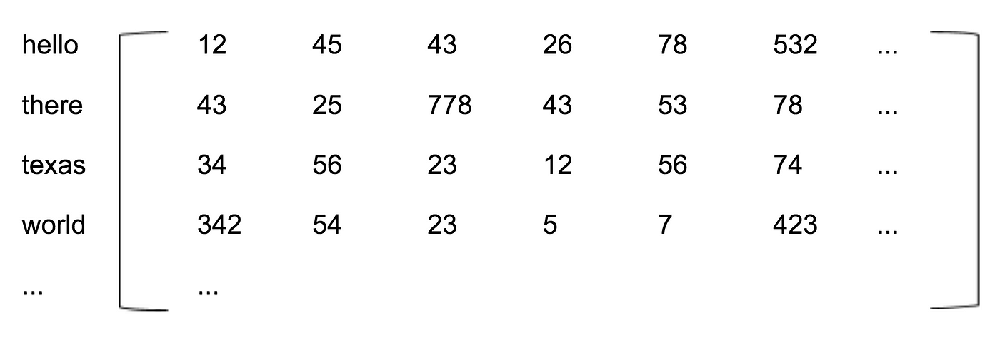

In [20]:

def create_embedding_matrix(tokens, embedding):
    """creates an embedding matrix from pre-trained embeddings for a new vocabulary. It also adds an extra vector
    vector of zeroes in row 0 to embed the padding token, and initializes missing tokens as vectors of 0s"""
    oov = set()
    size = embedding.vector_size
    # note the extra zero vector that will used for padding
    embedding_matrix=np.zeros((len(tokens),size))
    c = 0
    for i in range(1,len(tokens)):
        try:
            embedding_matrix[i]=embedding[tokens[i]]
        except KeyError: #to catch the words missing in the embeddings
            try:
                embedding_matrix[i]=embedding[tokens[i].lower()]
            except KeyError:
                #if the token does not have an embedding, we initialize it as a vector of 0s
                embedding_matrix[i] = np.zeros(size)
                #we keep track of the out of vocabulary tokens
                oov.add(tokens[i])
                c +=1
    print(f'{c/len(tokens)*100} % of tokens are out of vocabulary')
    return embedding_matrix, oov

# load the pretrained embeddings (these can be used as the embedding argument in create_embedding_matrix)
# look into other gloves - is glove_twitter_25 the best?
glove = gensim.downloader.load('glove-wiki-gigaword-100') 

#get the embedding matrix and out of vocabulary words for our tweet_eval vocabulary
embedding_matrix, oov = create_embedding_matrix(total_vocabulary, glove)


31.577384266993352 % of tokens are out of vocabulary



4. Convert the tweets to vectors of indices showing which words they contain (these indices will also correspond to the rows of those words in the embedding matrix), including their padding. For example, "the cat is on the mat" could be represented as: [ 0, 0, 0, 0, 5, 1, 2, 4, 5, 3], if those were the positions that corresponded to those words in our dictionary.


In [21]:
# you do not need to modify this code block; simply read through the comments, so you understand what it does, and then run it

# def text_to_indices(text, total_vocabulary):
#     """turns the input text (one tweet) into a vector of indices in total_vocabulary that corresponds to the tokenized words in the input text"""
#     encoded_text = []
#     for t in text:
#         try:
#             index = total_vocabulary.index(t.lower())
#             encoded_text.append(index)
#         except:
#              continue
#     return encoded_text

# def add_padding(vector, max_length, padding_index):
#     """adds copies of the padding token to make the input vector the max_length size, so that all inputs are the same length (the length of tweet with most words)"""
#     if len(vector) < max_length:
#         vector = [padding_index for _ in range(max_length-len(vector))] + vector
#     return vector

In [22]:
def text_to_indices(text, total_vocabulary):
    """Turns the input text (one tweet) into a vector of indices in total_vocabulary that corresponds to the tokenized words in the input text"""
    vocab_dict = {word: index for index, word in enumerate(total_vocabulary)}

    # Initialize a list to store the encoded text
    encoded_text = []

    for t in text:
        # Convert the token to lowercase to match the vocabulary
        t_lower = t.lower()
        if t_lower in vocab_dict:
            # Use the dictionary to quickly find the index
            encoded_text.append(vocab_dict[t_lower])

    return encoded_text

def add_padding(vector, max_length, padding_index):
    """adds copies of the padding token to make the input vector the max_length size, so that all inputs are the same length (the length of tweet with most words)"""
    if len(vector) < max_length:
        vector = [padding_index for _ in range(max_length-len(vector))] + vector
    return vector

In [24]:
# getting the feature vectors by applying the text_to_indices function to each
# tweet in the train and validation corpus
train_english_features = [[text_to_indices(x, total_vocabulary) for x in document] for document in english_tokenized_text[0]]
val_english_features = [[text_to_indices(x, total_vocabulary) for x in document] for document in english_tokenized_text[0]]

longest_document = max(train_english_features+val_english_features, key=len)
max_length = len(longest_document)
padding_index = 0



In [28]:
train_english_features

[[[21411], [24854], [8889], [19280], [24005], [24854], [18140]],
 [[14275], [16223], [13577], [17441], [12637]],
 [[24005], [15576], [13577], [19788], [21496], [25895]],
 [[19280],
  [8889],
  [24005],
  [24854],
  [21496],
  [8889],
  [17441],
  [17441],
  [25895]],
 [[10115], [13577], [14957], [8889], [19280]],
 [[25495], [16223], [24005], [15576]],
 [[24005], [15576], [13577]],
 [[22395], [24005], [24854], [12637], [25895]],
 [[19788], [14275]],
 [[13577], [17441], [13577], [11107], [24005], [21496], [19788]],
 [[3], [3], [18140], [8889]],
 [[3], [3], [14957], [19280], [13577], [24005]],
 [[3], [3], [16223], [11107]],
 [[16223],
  [19280],
  [24005],
  [13577],
  [21496],
  [8889],
  [11107],
  [24005],
  [16223],
  [19788],
  [19280],
  [22395]],
 [[7125]],
 [[8889], [22395]],
 [[24005], [15576], [13577]],
 [[13577], [17441], [13577], [11107], [24005], [21496], [19788]],
 [[3], [3], [18140], [8889]],
 [[3], [3], [14957], [19280], [13577], [24005]],
 [[3], [3], [16223], [11107]],
 [

In [30]:
# getting the feature vectors by applying the text_to_indices function to each
# tweet in the train and validation corpus
train_english_features = [text_to_indices(x, total_vocabulary) for x in english_tokenized_text]
val_english_features = [text_to_indices(x, total_vocabulary) for x in english_tokenized_text]

longest_document = max(train_english_features+val_english_features, key=len)
max_length = len(longest_document)
padding_index = 0

ValueError: 'quantum' is not in list

In [28]:
print(english_tokenized_text[10])
print(train_english_features[10])


['in', 'the', 'united', 'states', ',', 'the', 'law', 'regarding', 'murder', 'varies', 'by', 'jurisdiction', '.', 'in', 'most', 'u', '.', 's', '.', 'jurisdiction', '##s', 'there', 'is', 'a', 'hierarchy', 'of', 'acts', ',', 'known', 'collective', '##ly', 'as', 'homi', '##cide', ',', 'of', 'which', 'first', 'degree', 'murder', 'and', 'fel', '##ony', 'murder', 'are', 'the', 'most', 'serious', ',', 'followed', 'by', 'second', 'degree', 'murder', ',', 'followed', 'by', 'voluntary', 'mans', '##lau', '##ghter', 'and', 'in', '##vol', '##unta', '##ry', 'mans', '##lau', '##ghter', 'which', 'are', 'not', 'as', 'serious', ',', 'and', 'ending', 'finally', 'in', 'just', '##if', '##ia', '##ble', 'homi', '##cide', ',', 'which', 'is', 'not', 'a', 'crime', 'at', 'all', '.', 'however', ',', 'because', 'there', 'are', 'at', 'least', '52', 'relevant', 'jurisdiction', '##s', ',', 'each', 'with', 'its', 'own', 'criminal', 'code', ',', 'this', 'is', 'a', 'considerable', 'sim', '##pli', '##fication', '.', '[', 

In [16]:
english_tokenized_text[-5:]

[['the',
  'medley',
  'relay',
  'was',
  'scheduled',
  'in',
  'the',
  'olympisk',
  '##i',
  'sports',
  'complex',
  'for',
  'thursday',
  ',',
  '24',
  'july',
  ',',
  'the',
  'fifth',
  'day',
  'of',
  'swimming',
  'competition',
  ',',
  'with',
  'heat',
  '##s',
  'from',
  '11',
  'am',
  ',',
  'and',
  'the',
  'final',
  'from',
  '9',
  'pm',
  '.',
  '[',
  '8',
  ']',
  'in',
  'the',
  'morning',
  'sweden',
  'was',
  'dis',
  '##qua',
  '##lifi',
  '##ed',
  'in',
  'the',
  'first',
  'heat',
  ',',
  'while',
  'australia',
  'and',
  'the',
  'soviet',
  'union',
  'competed',
  'in',
  'the',
  'second',
  'heat',
  '.',
  '[',
  '9',
  ']',
  'with',
  'their',
  'superior',
  'depth',
  ',',
  'the',
  'home',
  'team',
  'was',
  'able',
  'to',
  'rest',
  'their',
  'entire',
  'first',
  '-',
  'choice',
  'quartet',
  'in',
  'the',
  'heat',
  '##s',
  ',',
  'while',
  'australia',
  'was',
  'only',
  'willing',
  'to',
  'rest',
  'kerry',
  ',

In [25]:
# padding the feature vectors by applying the add_padding function to each
# tweet in the train and validation corpus
train_english_features = [add_padding(x, max_length, padding_index) for x in train_english_features]
val_english_features = [add_padding(x, max_length, padding_index) for x in val_english_features]

5. Pass the training and validation data to our custom PyTorch DataSet class, and pass that to a data loader. 

In [26]:
class QuestionClassifierTrain(torch.utils.data.Dataset):
    # defining the sources of the data
    def __init__(self, features, labels):
        self.X = torch.from_numpy(np.array(features))
        self.y = torch.from_numpy(np.array(labels))

    def __getitem__(self, index):
        X = self.X[index]
        y = self.y[index].unsqueeze(0)
        return X, y

    def __len__(self):
        return len(self.y)
    

data_train_english = QuestionClassifierTrain(train_english_features, correct_answer_train_english)
data_val_english = QuestionClassifierTrain(val_english_features, correct_answer_val_english)

train_loader = torch.utils.data.DataLoader(data_train_english, batch_size=64)
val_loader = torch.utils.data.DataLoader(data_val_english, batch_size = 64)

ValueError: setting an array element with a sequence. The requested array has an inhomogeneous shape after 2 dimensions. The detected shape was (7389, 4095) + inhomogeneous part.

In [27]:
# loop through train_english_features to check for nested lists
for i in train_english_features:
    for x in i:
        if isinstance(x, list):
            print("yes")
        

yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes


In [47]:
np.array(train_english_features)

ValueError: setting an array element with a sequence. The requested array has an inhomogeneous shape after 2 dimensions. The detected shape was (7389, 4095) + inhomogeneous part.

In [38]:
train_english_features[0]

[0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,


# 2. Define and train the RNN model

1. Use the skeleton code below to create an RNN model with pre-trained embedding layer. The embedding layer should be followed by a [RNN](https://pytorch.org/docs/stable/generated/torch.nn.RNN.html) layer, which in its turn is followed by a linear layer. In the forward pass, the model should encode the input (turn it into embeddings), retrieve the final activation state from the last RNN unit. The activation of the final unit in an RNN will (hopefully) encode all relevant info about the whole sequence.



In [40]:
# defining the embedding step and RNN model

class SimpleRNN(torch.nn.Module):
    def __init__(self, rnn_size, n_classes, embedding_matrix):
        # initialize the model with a certain dimension of the RNN unit activations (this is rnn_size)
        # and a certain number of output classes
        
        super().__init__()
        
        #applying the embeddings to the inputs
        self.embedding = torch.nn.Embedding.from_pretrained(torch.FloatTensor(embedding_matrix), padding_idx=0, freeze=True)
        emb_dim = embedding_matrix.shape[1] #this will be the size of the input for the RNN
        
        #define the RNN itself 
        self.rnn = torch.nn.RNN(emb_dim, rnn_size, batch_first=True)
        #set batch_first=True for your RNN layer
        
        #define the output layer (no softmax needed here; we will apply softmax as part of the loss calculation)
        #applies a linear transformation to the RNN
        #final layer state and outputs scores for the n classes
        self.outputs = torch.nn.Linear(rnn_size, n_classes)

        
    def forward(self, inputs):
        # encode the input vectors
        encoded_inputs = self.embedding(inputs)
        
        # The RNN returns two tensors: one representing the hidden states at all positions,
        # and another representing only the final hidden states.
        # In this many-to-one model, we only need the final hidden states.
        all_states, final_state = self.rnn(encoded_inputs)
        final_state = final_state.squeeze() #flatten to make sure it has the right dimensions for the next linear step
        
        # run the final state through the output layer
        outputs = self.outputs(final_state)
        return outputs


In [41]:
# initializing and training the model:
myRNN = SimpleRNN(rnn_size=100, n_classes=3, embedding_matrix=embedding_matrix)

print(myRNN)

SimpleRNN(
  (embedding): Embedding(24128, 100, padding_idx=0)
  (rnn): RNN(100, 100, batch_first=True)
  (outputs): Linear(in_features=100, out_features=3, bias=True)
)


In [32]:
# training loop
def training_loop(model, num_epochs):
    loss_function = torch.nn.CrossEntropyLoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

    for epoch in range(num_epochs):
        losses = []
        for batch_index, (inputs, targets) in enumerate(train_loader):

            optimizer.zero_grad()
            outputs = model(inputs).squeeze()
            targets = targets.squeeze() #dependending on your torch version you might have to use targets = targets.squeeze().long()
            loss = loss_function(outputs, targets)
            loss.backward()
            optimizer.step()
            losses.append(loss.item())
        print(f'Epoch {epoch+1}: loss {np.mean(losses)}')
    return model

def evaluate(model, val_loader):
    predictions = []
    labels = []
    with torch.no_grad(): # for evaluation we don't backpropagate and update weights anymore
        for batch_index, (inputs, targets) in enumerate(val_loader):
            outputs = torch.softmax(model(inputs), 1 ) # apply softmax to get probabilities/logits
            # getting the indices of the logit with the highest value, which corresponds to the predicted class (as labels 0, 1, 2)
            vals, indices = torch.max(outputs, 1)
            # accumulating the predictions
            predictions += indices.tolist()
            # accumulating the true labels
            labels += targets.tolist()
    
    acc = accuracy_score(predictions, labels)
    print(f'Model accuracy: {acc}')
    return acc, predictions

In [42]:
# initializing and training the model:
myRNN = SimpleRNN(rnn_size=100, n_classes=3, embedding_matrix=embedding_matrix)

myRNN = training_loop(myRNN, 3)
acc, preds = evaluate(myRNN, val_loader)

Epoch 1: loss 0.6693197935869805
Epoch 2: loss 0.9427414816515199
Epoch 3: loss 0.8984897638638986
Model accuracy: 0.494949494949495


2. Instatiate a version of the model with `rnn_size=100` and inspect it to see its layers and dimensions. 
3. Try training the model with the same Adam gradient descent optimizer and CrossEntropyLoss as in the previous problem set, training for 3 epochs. Then evaluate its accuracy.

`Note`. We did not use the softmax layer in the forward function. This is because CrossEntropyLoss applies softmax automatically and therefore the function expects the unnormalized probabilities from the final linear layer. That means, however, that your evaluate function needs to use the softmax function on the outputs of your model when predicting. The following snippet might be helpful for evaluation

torch.softmax(model(inputs), 1)

# 3. Other types of RNNs

1. Implement a `type` parameter for the model which will control the type of RNN cell used: [vanilla RNN](https://pytorch.org/docs/stable/generated/torch.nn.RNN.html) or [LSTM](https://pytorch.org/docs/stable/generated/torch.nn.LSTM.html). Note that the output from LSTM cells is different from RNN cells, and we need to adjust our output handling in the forward pass accordingly. Try training the LSTM version of the model for 3 epochs, and compare its accuracy to the RNN version.


In [43]:
# advanced version supporting multiple types of RNN layers

class RNN_or_LSTM(torch.nn.Module):
    def __init__(self, rnn_size, n_classes, embedding_matrix, type="RNN"):
        # initialize the model with a certain dimension of the RNN unit activations (this is rnn_size)
        # and a certain number of output classes
        
        super().__init__()
        
        #applying the embeddings to the inputs
        self.embedding = torch.nn.Embedding.from_pretrained(torch.FloatTensor(embedding_matrix), padding_idx=0, freeze=True)
        emb_dim = embedding_matrix.shape[1]
        
        #remember the batch_first=True argument
        if type == "RNN":
            self.rnn = torch.nn.RNN(emb_dim, rnn_size, batch_first=True)
        elif type == "LSTM":
            self.rnn = torch.nn.LSTM(emb_dim, rnn_size, batch_first=True)   
        else:
            raise LookupError("Only RNN and LSTM are supported.")
        self.output = torch.nn.Linear(rnn_size, n_classes)

    def forward(self, inputs):
        
        # encode the input vectors
        encoded_inputs = self.embedding(inputs)

        #apply the RNN or LSTM
        if type == "RNN":
            all_states, final_state = self.rnn(encoded_inputs)
        else:
            # LSTM's output is different and needs to be treated differently, see documentation for details
            all_states, (final_state, c_n) = self.rnn(encoded_inputs)
        
        # run the final states through the output layer
        outputs = self.output(final_state.squeeze())
        return outputs

In [44]:
myLSTM = RNN_or_LSTM(rnn_size=100, n_classes=3, type='LSTM', embedding_matrix=embedding_matrix)



myLSTM = training_loop(myLSTM, 3)
acc, preds = evaluate(myLSTM, val_loader)

Epoch 1: loss 1.028139053936245
Epoch 2: loss 0.9634627219417999
Epoch 3: loss 0.8181146704431238
Model accuracy: 0.49595959595959593



2. Also implement a bidirectional RNN instead of a standard, one-direction RNN. You will have to concatenate the final state of the left-to-right RNN with that of the right-to-left RNN, and feed that into your output layer. Use the code snippet below in your model definition to help you use right parts of the final state tensors. Also that your linear layer has the correct input size--its inputs are now twice the size of the RNN unit activations, because it is getting activations from two different RNNs. Train and evaluate this model as before.

Note: you will see that the bidirectional RNN does not get us better performance. This has something to do with the way we are front-padding the tweets (to equalize their length), combined with the fact that the BRNN goes through the tweets in reverse, so right to left. Thinking of the vanishing gradient problem, can you guess why the second, reverse RNN does not help us in this case?

In [45]:
class Bidirectional_RNN(torch.nn.Module):
    def __init__(self, rnn_size, n_classes, embedding_matrix):
        # initialize the model with a certain dimension of the RNN unit activations (this is rnn_size)
        # and a certain number of output classes
        
        super().__init__()
        
        #applying the embeddings to the inputs
        self.embedding = torch.nn.Embedding.from_pretrained(torch.FloatTensor(embedding_matrix), padding_idx=0, freeze=True)
        emb_dim = embedding_matrix.shape[1] #this will be the size of the input for the RNN
        
        #define the RNN itself 
        self.rnn = torch.nn.RNN(input_size=emb_dim, hidden_size=rnn_size, num_layers=1, bidirectional=True, batch_first=True)
        #set batch_first=True for your RNN layer
        
        #define the output layer (no softmax needed here; we will apply softmax as part of the loss calculation)
        #applies a linear transformation to the RNN
        #final layer state and outputs scores for the n classes
        self.fc_logits = torch.nn.Linear(2*rnn_size, n_classes)

        
    def forward(self, inputs):
        # encode the input vectors
        encoded_inputs = self.embedding(inputs)
        
        # NB: for a bidirectional RNN, the final state corresponds to the *last* token
        # in the forward direction and the *first* token in the backward direction.
        #Notice that we use torch.concat to concatenate the final states from the forward and backward directions
        rnn_out, final_state = self.rnn(encoded_inputs)
        final_states_combined = torch.cat([final_state[-2,:,:], final_state[-1,:,:]], dim=1)

        # run the output through the final linear layer
        outputslinear = self.fc_logits(final_states_combined)
        return outputslinear

In [46]:
biRNN = Bidirectional_RNN(rnn_size=100, n_classes=3, embedding_matrix=embedding_matrix)

biRNN = training_loop(biRNN, 3)
acc, preds = evaluate(biRNN, val_loader)

Epoch 1: loss 0.6604268401141122
Epoch 2: loss 0.8244968475171782
Epoch 3: loss 0.6213777293290558
Model accuracy: 0.49696969696969695


3. Experiment with a second recurrent layer to implement a deep (or stacked) RNN. This can be done using the parameters of [RNN](https://pytorch.org/docs/stable/generated/torch.nn.RNN.html).